In [ ]:
            #### MACHINE LEARNING EM PYTHON - PARTE 1 - CLASSIFICAÇÃO (PROCESSO COMPLETO) ####

''' Definiçao do Problema de Negócio: Vamos criar um modelo que seja capaz de
prever se uma pessoa pode ou não desenvolver diabetes. Para isso, usaremos
dados históricos de pacientes, disponíveis no dataset abaixo          
              
dataset:Pima Indians Diabete DataSet:http://archive.ics.uci.edu/ml/datasets/diabetes          
              
Este dataset descreve os registros médicos entre pacientes do Pima Indians e cada
registro está marcado se o paciente desenvolveu ou não diabetes.    '''

In [2]:
import sklearn as sl
import warnings
warnings.filterwarnings("ignore")
sl.__version__

'0.21.2'

In [4]:
#### 1 - CARREGANDO E EXTRAINDO OS DADOS #### 

# Carregando arquivo csv Usando Pandas
import pandas as pd
arquivo = "pima-data.csv"
colunas = ["preg", "plas", "pres", "skin", "test", "mass", "pedi", "age", "class"]
dados_2 = pd.read_csv(arquivo, names = colunas)
print(dados_2.shape)
dados_2.head() # É salvo como dataframe
dados = dados_2

(768, 9)


In [5]:
#### 2 - ANÁLISE EXPLORATÓRIA DE DADOS ####

    ## Estatistica Descritiva ## 

# Visualizando as primeiras 20 linhas dos dados
dados.head(20)

,preg,plas,pres,skin,test,mass,pedi,age,class
0,6,148,72,35,0,33.6,0.627,50,1
1,1,85,66,29,0,26.6,0.351,31,0
2,8,183,64,0,0,23.3,0.672,32,1
3,1,89,66,23,94,28.1,0.167,21,0
4,0,137,40,35,168,43.1,2.288,33,1
5,5,116,74,0,0,25.6,0.201,30,0
6,3,78,50,32,88,31.0,0.248,26,1
7,10,115,0,0,0,35.3,0.134,29,0
8,2,197,70,45,543,30.5,0.158,53,1
9,8,125,96,0,0,0.0,0.232,54,1


In [6]:
# Visualizando as dimensoes
dados.shape

(768, 9)

In [7]:
# Visualizando os tipos dos dados no dataset
dados.dtypes

preg       int64
plas       int64
pres       int64
skin       int64
test       int64
mass     float64
pedi     float64
age        int64
class      int64
dtype: object

In [8]:
# Sumario Estatistico dos dados
dados.describe()

,preg,plas,pres,skin,test,mass,pedi,age,class
count,768.000000,768.000000,768.000000,768.000000,768.000000,768.000000,768.000000,768.000000,768.000000
mean,3.845052,120.894531,69.105469,20.536458,79.799479,31.992578,0.471876,33.240885,0.348958
std,3.369578,31.972618,19.355807,15.952218,115.244002,7.884160,0.331329,11.760232,0.476951
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.078000,21.000000,0.000000
25%,1.000000,99.000000,62.000000,0.000000,0.000000,27.300000,0.243750,24.000000,0.000000
50%,3.000000,117.000000,72.000000,23.000000,30.500000,32.000000,0.372500,29.000000,0.000000
75%,6.000000,140.250000,80.000000,32.000000,127.250000,36.600000,0.626250,41.000000,1.000000
max,17.000000,199.000000,122.000000,99.000000,846.000000,67.100000,2.420000,81.000000,1.000000


In [9]:
''' Em problemas de classificção pode ser necessário balancear as classes. Classes 
    desbalanceadas (ou seja, volume maior de um dos tios de classes) são comuns e 
    precisam set tratadas durante a fase de pré-processamento. Podemos ver abaixo que 
    existe uma clara desproporção entre as classes 0 (nao diabetes) e 1 (diabetes) 
'''

' Em problemas de classificção pode ser necessário balancear as classes. Classes \n    desbalanceadas (ou seja, volume maior de um dos tios de classes) são comuns e \n    precisam set tratadas durante a fase de pré-processamento. Podemos ver abaixo que \n    existe uma clara desproporção entre as classes 0 (nao diabetes) e 1 (diabetes) \n'

In [10]:
# Distibuição das classes
dados.groupby("class").size()

class
0    500
1    268
dtype: int64

In [11]:
# Correlaçao - Pearson
dados.corr(method = "pearson")

,preg,plas,pres,skin,test,mass,pedi,age,class
preg,1.000000,0.129459,0.141282,-0.081672,-0.073535,0.017683,-0.033523,0.544341,0.221898
plas,0.129459,1.000000,0.152590,0.057328,0.331357,0.221071,0.137337,0.263514,0.466581
pres,0.141282,0.152590,1.000000,0.207371,0.088933,0.281805,0.041265,0.239528,0.065068
skin,-0.081672,0.057328,0.207371,1.000000,0.436783,0.392573,0.183928,-0.113970,0.074752
test,-0.073535,0.331357,0.088933,0.436783,1.000000,0.197859,0.185071,-0.042163,0.130548
mass,0.017683,0.221071,0.281805,0.392573,0.197859,1.000000,0.140647,0.036242,0.292695
pedi,-0.033523,0.137337,0.041265,0.183928,0.185071,0.140647,1.000000,0.033561,0.173844
age,0.544341,0.263514,0.239528,-0.113970,-0.042163,0.036242,0.033561,1.000000,0.238356
class,0.221898,0.466581,0.065068,0.074752,0.130548,0.292695,0.173844,0.238356,1.000000


In [12]:
# Skewness (ou simetria) verifica a distribuição dos dados
dados.skew()

preg     0.901674
plas     0.173754
pres    -1.843608
skin     0.109372
test     2.272251
mass    -0.428982
pedi     1.919911
age      1.129597
class    0.635017
dtype: float64

In [13]:
# Kursose verifica a distribuição dos dados
dados.kurt()

preg     0.159220
plas     0.640780
pres     5.180157
skin    -0.520072
test     7.214260
mass     3.290443
pedi     5.594954
age      0.643159
class   -1.600930
dtype: float64

In [14]:
   ## VISUALIZANDO DADOS COM MATPLOTLIB ##

import matplotlib.pyplot as plot
%matplotlib inline

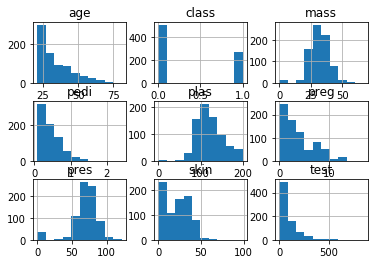

In [15]:
# Histograma Univariado - Por variavel
dados.hist()
plot.show()

In [16]:
''' Atraves deste histograma é possivel verificar as distribuições dos dados (normal/exponencial...) a simetria dos dados e se 
    eles contém outliers. Podemos ver que os atributos age, pedi e test possuem uma distribuição exponencial. Podemos ver que as
    colunas mass e pres possuem uma distribuição normal '''

' Atraves deste histograma é possivel verificar as distribuições dos dados (normal/exponencial...) a simetria dos dados e se \n    eles contém outliers. Podemos ver que os atributos age, pedi e test possuem uma distribuição exponencial. Podemos ver que as\n    colunas mass e pres possuem uma distribuição normal '

In [17]:
# Density plot - Graficos de Desnidade -> os Density plots são outra froma de visualizar a distribuição dos dados para cada atributo. O plot é como uma especie de histograma abstrato com uma curva suave através do topo dos bins de um histograma. Pode ser mais fácil indentificar a distribuição dos dados usando um density plot.

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x000001C409E35C18>,
      dtype=object)

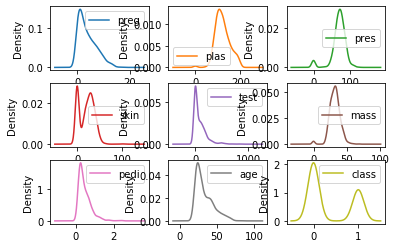

In [18]:
# Density plot Univariado
dados.plot(kind = "density", subplots = True, layout = (3, 3), sharex = False)

In [19]:
# Com boxplots tambem podemos revisar a distribuição dos dados para cada atributo. A linha no centro (vermelha) é o valor da mediana (igual a 50%), a linha abaixo é o quartil 25% e a linha acima o quartil 75% e a linha acima o quartil 75%. O boxplot ajuda a ter uma ideia da dispersão dos dados e os possiveis outliers.

# Podemos cer que a dispersao dos dados e bem diferente entre os atributos. As colunas age, skin, e test possuem uma simetria muito proxima a valores de dados menores

preg        AxesSubplot(0.125,0.657941;0.227941x0.222059)
plas     AxesSubplot(0.398529,0.657941;0.227941x0.222059)
pres     AxesSubplot(0.672059,0.657941;0.227941x0.222059)
skin        AxesSubplot(0.125,0.391471;0.227941x0.222059)
test     AxesSubplot(0.398529,0.391471;0.227941x0.222059)
mass     AxesSubplot(0.672059,0.391471;0.227941x0.222059)
pedi           AxesSubplot(0.125,0.125;0.227941x0.222059)
age         AxesSubplot(0.398529,0.125;0.227941x0.222059)
class       AxesSubplot(0.672059,0.125;0.227941x0.222059)
dtype: object

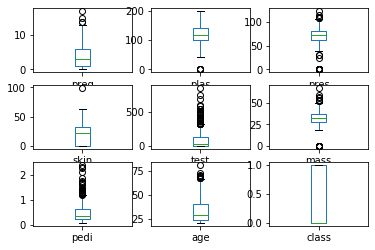

In [20]:
# Box and Whisker plots
dados.plot(kind = "box", subplots = True, layout = (3, 3), sharex = False, sharey = False)

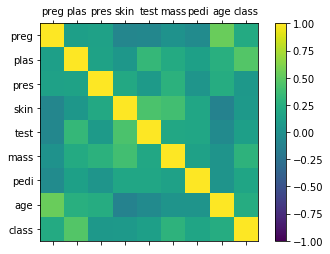

In [21]:
# Matriz de Correlação com nomes das variaveis
correlations = dados.corr()

# Plot
import numpy as np
fig = plot.figure()
ax = fig.add_subplot(111)
cax = ax.matshow(correlations, vmin = -1, vmax = 1)
fig.colorbar(cax)
ticks = np.arange(0, 9, 1)
ax.set_xticks(ticks)
ax.set_yticks(ticks)
ax.set_xticklabels(colunas)
ax.set_yticklabels(colunas)
plot.show()

In [22]:
# Um scatterplot mostra o relacionamento entre duas variáveis como pontos em duas dimensões sendo um eixo para cada variável. Podemos criar um scatterplot para cada par de variáveis em nosso dataset. A exemplo da matriz da correlaçao, o scatterplot matrix é simetrico.

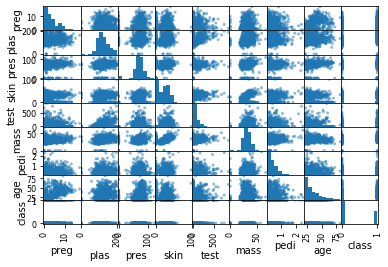

In [23]:
# ScatterPlot
from pandas.plotting import scatter_matrix
scatter_matrix(dados)
plot.show()

In [24]:
   ### VISUALIZAÇÃO COM SEABORN ###
import seaborn as sns

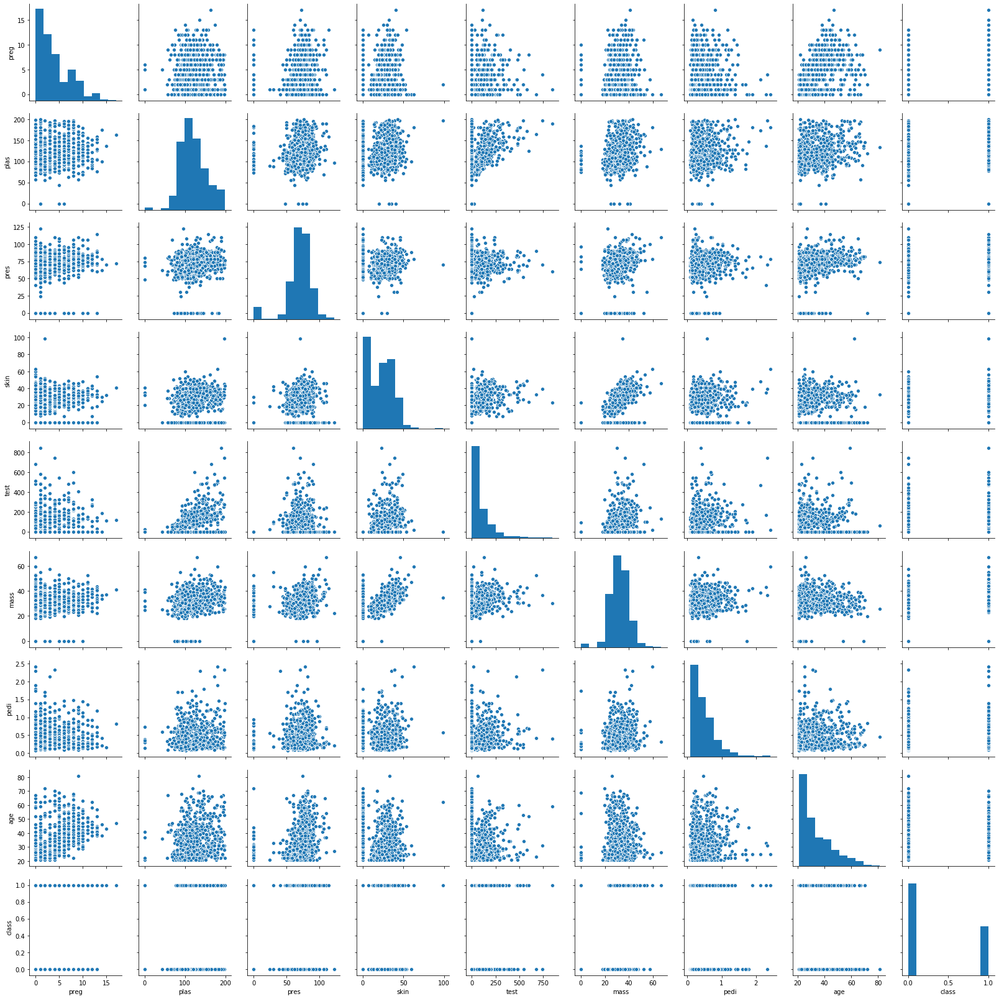

In [25]:
sns.pairplot(dados)

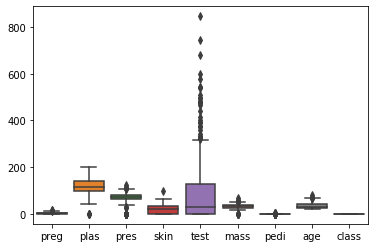

In [26]:
# Boxplot com orientação vertical
sns.boxplot(data = dados, orient = "v")

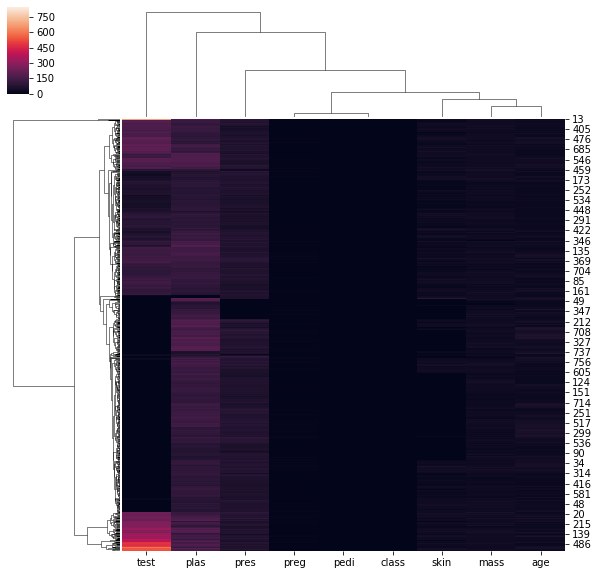

In [27]:
# Clustermap
sns.clustermap(dados)

In [28]:
dados.describe

<bound method NDFrame.describe of      preg  plas  pres  skin  test  mass   pedi  age  class
0       6   148    72    35     0  33.6  0.627   50      1
1       1    85    66    29     0  26.6  0.351   31      0
2       8   183    64     0     0  23.3  0.672   32      1
3       1    89    66    23    94  28.1  0.167   21      0
4       0   137    40    35   168  43.1  2.288   33      1
..    ...   ...   ...   ...   ...   ...    ...  ...    ...
763    10   101    76    48   180  32.9  0.171   63      0
764     2   122    70    27     0  36.8  0.340   27      0
765     5   121    72    23   112  26.2  0.245   30      0
766     1   126    60     0     0  30.1  0.349   47      1
767     1    93    70    31     0  30.4  0.315   23      0

[768 rows x 9 columns]>

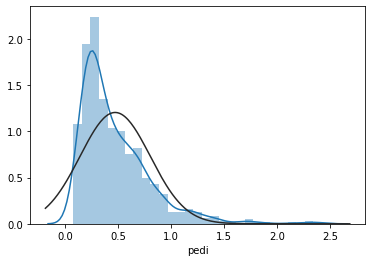

In [29]:
from scipy import stats
sns.distplot(dados.pedi, fit = stats.norm)

In [30]:
#### 3 - PREPARANDO OS DADOS PARA MACHINE LEARNING ####

# Muitos algoritmos esperam receber os dados em um formato específico. É nosso trabalho preparar os dados em uma estrutura que seja adequada ao algoritmo que será utilizado

# É muito possível que nos tenhamos que realizar tarefas de Pré-processamento nos dados. Esse é um passo necessario dentro do processo. O desafio é o fato que cada algoritmo requer uma estrutura diferente. O que pode requerer transformações diferentes nos dados. Mas é possível em alguns, obter bons resultados sem um trabalho de pre-processamento. Mas é uma boa pratica criar diferentes visoes e trasformações dos dados de modo a poder testar diferentes algoritmos de Machine Learning.

In [31]:
## NORMALIZAÇÃO - METODO 1 ->  É uma das primeiras tarefas de pre-processamento, é colocar seus dados na mesma escala. Muitos algoritmos de Machine Learning vão se beneficiar disso e produzir resultados melhores. Esta etapa também é chamada de normalização e significa colocar os dados em uma escala com range entre 0 e 1, isso é util para a otimização, sendo usado no core dos algoritmos de Machine Learning, como gradient descent. Isso também é util para algoritmos como regressão e redes neurais e algoritmos que usam medidas de distancia, como KNN. O scikit-learn possui uma função para esta etapa chamada MinMaxScale()

In [34]:
# Transformando os dados para a mesma escala (entre 0 e 1)

# Import dos módulos
from sklearn.preprocessing import MinMaxScaler

# Separando o array em componentes de input (x) e output (y)
array = dados.values
x = array[:, 0:8]
y = array[:,8]

# Gerando a nova escala (normalizando os dados)
scaler = MinMaxScaler(feature_range = (0, 1)) # Range da escala (de 0 a 1)
rescaledX = scaler.fit_transform(x)

# Sumarizando os dados transformados
print("Dados Originais: \n\n", dados.values)
print("\nDados Normalizados: \n\n", rescaledX[0:5, :])

Dados Originais: 

 [[  6.    148.     72.    ...   0.627  50.      1.   ]
 [  1.     85.     66.    ...   0.351  31.      0.   ]
 [  8.    183.     64.    ...   0.672  32.      1.   ]
 ...
 [  5.    121.     72.    ...   0.245  30.      0.   ]
 [  1.    126.     60.    ...   0.349  47.      1.   ]
 [  1.     93.     70.    ...   0.315  23.      0.   ]]

Dados Normalizados: 

 [[0.35294118 0.74371859 0.59016393 0.35353535 0.         0.50074516
  0.23441503 0.48333333]
 [0.05882353 0.42713568 0.54098361 0.29292929 0.         0.39642325
  0.11656704 0.16666667]
 [0.47058824 0.91959799 0.52459016 0.         0.         0.34724292
  0.25362938 0.18333333]
 [0.05882353 0.44723618 0.54098361 0.23232323 0.11111111 0.41877794
  0.03800171 0.        ]
 [0.         0.68844221 0.32786885 0.35353535 0.19858156 0.64232489
  0.94363792 0.2       ]]


In [35]:
## NORMALIZAÇÃO - METODO 2 -> No sckit-learn, normalização se refere a ajustar a escala de cada observação (linha) de modo que ela tenha comprimento igual a 1 (chamado vetor de comprimento 1). Este método de pré-processamento é útil quando temos datasets específicos (com muitos zeros) e atributos com escala muito variada. Útil quando usamos algoritmos de redes neurais ou que usam medidads de distancia, como KNN. O sckit-learn possui uma função para esta etapa, chamada Normalize() 

In [36]:
# Normalizando os dados (comprimento igual a 1)
from sklearn.preprocessing import Normalizer

# Criando e separando o array em componentes de input e output
array = dados.values
x = array[:,0:8]
y = array[:,8]

# Gerando os dados normalizados
scaler = Normalizer().fit(x)
normalizedX = scaler.transform(x)

# Sumarizando os dados transformados
print("Dados Originais: \n\n", dados.values)
print("\nDados Normalizados: \n\n", normalizedX[0:5, :])

Dados Originais: 

 [[  6.    148.     72.    ...   0.627  50.      1.   ]
 [  1.     85.     66.    ...   0.351  31.      0.   ]
 [  8.    183.     64.    ...   0.672  32.      1.   ]
 ...
 [  5.    121.     72.    ...   0.245  30.      0.   ]
 [  1.    126.     60.    ...   0.349  47.      1.   ]
 [  1.     93.     70.    ...   0.315  23.      0.   ]]

Dados Normalizados: 

 [[0.03355237 0.82762513 0.40262844 0.19572216 0.         0.18789327
  0.00350622 0.27960308]
 [0.008424   0.71604034 0.55598426 0.24429612 0.         0.22407851
  0.00295683 0.26114412]
 [0.04039768 0.92409698 0.32318146 0.         0.         0.11765825
  0.00339341 0.16159073]
 [0.00661199 0.58846737 0.43639153 0.15207584 0.62152733 0.185797
  0.0011042  0.13885185]
 [0.         0.5963863  0.17412739 0.15236146 0.73133502 0.18762226
  0.00996009 0.14365509]]


In [37]:
### PADRONIZAÇÃO - Padronização é a tecnica para transformar os atributos com distribuição Gaussiana (normal) e diferentes médias e desvios padroes em uma distribuição Gaussiana com a média igual a 0 e desvio padrao igual a 1. Isso é útil para algoritmos que esperam que os dados estejam com uma distribuição Gaussiana, como regressão linear, regressão Logisticae a linear discriminal analisys. Funciona bem quando os dados já estão na mesma escala. O sckit-learn possui uma função para esta etapa chamada StandardScaler().

In [38]:
# Padronizando  os dados (o para a média, 1 para o desvio padrao)

# Import dos modulos
from sklearn.preprocessing import StandardScaler

# Separando o array em componentes de input e output (x e y)
array = dados.values
x = array[:,0:8]
y = array[:,8]

# Padronizando os dados 
scaler = StandardScaler().fit(x)
standardX = scaler.transform(x)

# Sumarizando os dados
print("Dados Originais: \n\n", dados.values)
print("\nDados Padronizados: \n\n", standardX[0:5, :])

Dados Originais: 

 [[  6.    148.     72.    ...   0.627  50.      1.   ]
 [  1.     85.     66.    ...   0.351  31.      0.   ]
 [  8.    183.     64.    ...   0.672  32.      1.   ]
 ...
 [  5.    121.     72.    ...   0.245  30.      0.   ]
 [  1.    126.     60.    ...   0.349  47.      1.   ]
 [  1.     93.     70.    ...   0.315  23.      0.   ]]

Dados Padronizados: 

 [[ 0.63994726  0.84832379  0.14964075  0.90726993 -0.69289057  0.20401277
   0.46849198  1.4259954 ]
 [-0.84488505 -1.12339636 -0.16054575  0.53090156 -0.69289057 -0.68442195
  -0.36506078 -0.19067191]
 [ 1.23388019  1.94372388 -0.26394125 -1.28821221 -0.69289057 -1.10325546
   0.60439732 -0.10558415]
 [-0.84488505 -0.99820778 -0.16054575  0.15453319  0.12330164 -0.49404308
  -0.92076261 -1.04154944]
 [-1.14185152  0.5040552  -1.50468724  0.90726993  0.76583594  1.4097456
   5.4849091  -0.0204964 ]]


In [41]:
## BINARIZAÇÃO - Nós podemos definir um valor em nossos dados, ao qual chamamos de threshold e entao definimos que todos os valores acima do threshold serão marcados como sendo 1 e todos os valores iguais ou abaixo do thresHold serão marcados como sendo 0. Isso é o que chamamos de Binarização. Isso é util quando temos probabilidades e queremos transformar os dados em algo com mais significado. O sckit-learn possui uma função para esta etapa, chamada Binarizer()

In [42]:
# Binarização

# Import do modulo
from sklearn.preprocessing import Binarizer

# Separando os dados em componentes de input e output (x e y)
array = dados.values
x = array[:,0:8]
y = array[:,8]

# Binariazando os dados
binarizer = Binarizer(threshold = 0.2).fit(x)
binarizedX = binarizer.transform(x)

print("Dados Originais: \n\n", dados.values)
print("\nDados Binarizados: \n\n", binarizedX[0:5, :])

Dados Originais: 

 [[  6.    148.     72.    ...   0.627  50.      1.   ]
 [  1.     85.     66.    ...   0.351  31.      0.   ]
 [  8.    183.     64.    ...   0.672  32.      1.   ]
 ...
 [  5.    121.     72.    ...   0.245  30.      0.   ]
 [  1.    126.     60.    ...   0.349  47.      1.   ]
 [  1.     93.     70.    ...   0.315  23.      0.   ]]

Dados Binarizados: 

 [[1. 1. 1. 1. 0. 1. 1. 1.]
 [1. 1. 1. 1. 0. 1. 1. 1.]
 [1. 1. 1. 0. 0. 1. 1. 1.]
 [1. 1. 1. 1. 1. 1. 0. 1.]
 [0. 1. 1. 1. 1. 1. 1. 1.]]


In [43]:
    ### 4 - FEATURE SELECTION -> SELEÇÃO DE VARIAVEIS ###

In [44]:
# Feature Selection -> Os atributos presentes nos datasets e que nos utilizamos nos dados de treino, terao grande influencia na precisão e resultado do seu modelo preditivo. Atributos irrelevantes terão impacto negativo na performance, enquanto atributos colineares podem afetar o grau de acurácia do modelo. O sckit-learn possui funções que automatizam o trabalho da extração e seleção de variaveis.

# A etapa de Feature Selection é onde selecionamos os atributos (variaveis) que serão melhores candidatas a variaveis preditoras. O Feature Selection nos ajuda a reduir o overfitting (quando  o algoritmo aprende demais), aumenta a acurácia do modelo e reduz o tempo de treinamento.

In [45]:
# SELEÇAO UNIVARIADA - Testes estatisticos podem ser usados para selecionar os atributos que possuem forte relacionamento com a variável que estamos tentando prever. O Sckit-learn fornece a função SelectKBest() que pode ser usada com diversos testes estatisticos, para selecionar os atributos. Vamos usar o teste qui-quadrado e selecionar os 4 melhores atributos que podem ser usados como variáveis preditoras

In [49]:
# Extração de Variaveis com Teste Estatisticos Univariados (Teste qui-quadrado neste exemplo)

# Import do modulo
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import chi2

# Carregando os dados
array = dados.values

# Definindo as variaveis de input e output (x e y)
x = array[:,0:8]
y = array[:,8]

# Função para seleçao de variaveis
best_var = SelectKBest(score_func = chi2, k = 4)

# Executa a função de pontuação em (X, Y) e obtem os recursos selecionados
fit = best_var.fit(x, y)

# Reduz x para os recursos selecionados
features = fit.transform(x)

# Resultados
print("\nNúmero Original de Features: ", x.shape[1])
print("\nNúmero Reduzido de Features: ", features.shape[1])
print("\nFeatures (Variaveis Selecionadas): \n", features)


Número Original de Features:  8

Número Reduzido de Features:  4

Features (Variaveis Selecionadas): 
 [[148.    0.   33.6  50. ]
 [ 85.    0.   26.6  31. ]
 [183.    0.   23.3  32. ]
 ...
 [121.  112.   26.2  30. ]
 [126.    0.   30.1  47. ]
 [ 93.    0.   30.4  23. ]]


In [50]:
### ELIMINAÇÃO RECURSIVA DE ATRIBUTOS -> Esta é outra tecnica para seleção de atributos, que recursivamente remove os atributos e constrói o modelo com os atributos remanescentes. Esta técnica utiliza a acurácia do modelo para identificar os atributos que mais contribuem para prever a variavél alvo. Em ingles esta tecnica é chamada Recursive Feature Elimination (RFE) ###

## O exemplo abaixo utiliza a tecnica de eliminação recursiva de atributos com um algoritmo de Regressão Logística para selecionar as 3 melhores variáveis preditoras. O RFE selecionou as variaveis prog, mass e pedi, que estao marcadas como True em "Atributos selecionados" e com valor 1 em "Ranking dos atributos"

In [56]:
# Eliminação Recursiva de Variáveis

# import dos modulos
from sklearn.feature_selection import RFE
from sklearn.linear_model import LogisticRegression

# Carregando os dados
array = dados.values

# Separando o array em variaveis preditoras e varivel target
x = array[:,0:8]
y = array[:,8]

# Criação do modelo
logisticRegression = LogisticRegression()

# RFE
rfe = RFE(logisticRegression, 3)
fit = rfe.fit(x, y)

# Print dos resultados
print("\nVariaveis Preditoras: ", dados.columns[0:8])
print("\nVariaveis Selecionadas: %s" % fit.support_)
print("\nRanking dos Atributos: %s" % fit.ranking_)
print("\nNúmero de Atributos: %d" % fit.n_features_)


Variaveis Preditoras:  Index(['preg', 'plas', 'pres', 'skin', 'test', 'mass', 'pedi', 'age'], dtype='object')

Variaveis Selecionadas: [ True False False False False  True  True False]

Ranking dos Atributos: [1 2 3 5 6 1 1 4]

Número de Atributos: 3


In [57]:
### MÉTODO ENSEMBLE PARA SELEÇÃO DE VARIÁVEIS -> Bagged Decision Trees, como o algoritmo Random Forest (esses sao chamados de Métodos Ensemble), podem ser usados para estimar a importancia de cada atributo. Esse método retorna um score para cada atributo ### 

## Quanto maior o score, maior a importancia do atributo

In [60]:
# Importancia do Atributo com o Extra Trees Classifier

# Import dos Módulos
from sklearn.ensemble import ExtraTreesClassifier

# Carregando os dados
array = dados.values

# Separando o array em componentes de input e output
x = array[:,0:8]
y = array[:,8]

# Criação do Modelo - Feature Selection
treeClassifier = ExtraTreesClassifier()
treeClassifier.fit(x, y)

# print dos Resultados
print("Colunas: ", dados.columns[0:8])
print("\nScores dos atributos: ",  treeClassifier.feature_importances_)

Colunas:  Index(['preg', 'plas', 'pres', 'skin', 'test', 'mass', 'pedi', 'age'], dtype='object')

Scores dos atributos:  [0.11089932 0.23494586 0.08902962 0.07841992 0.08319986 0.15842904
 0.10958777 0.13548861]


In [61]:
## REDUÇÃO DE DIMENSIONALIDADE (FEATURE EXTRACTION) ##

### PRINCIPAL COMPONENT ANALYSIS (PCA) -> O PCA foi inventado em 1901 por Karl Pearson e utiliza algebra linear para transformar dataset em uma forma comprimida, o que geralmente conhecido como Redução de Dimensionalidade. Com PCA nos podemos escolher o número de dimensoes (chamadas de componentes principais) no resultado transformado. Vamos usar PCA para selecionar 3 componentes principais ###

### A analise dos componentes principais (PCA) é um método para extração das variáveis importantes (na forma de componentes) a partir de um grande conjunto de variáveis, disponíveis em um conjunto de dados. Esta técnica permite extrar um número pequeno de conjuntos dimensionais a partir de um dataset altamente dimensional. Com menos variáveis a visualização tambem se torna miuto mais significativa. PCA é mais útil quando se lida com 3 ou mais dimensoes.

In [62]:
# Redução de Dimensionalidade com PCA

# importando os modulos
from sklearn.decomposition import PCA
from sklearn.preprocessing import MinMaxScaler

# Carregando os dados
array = dados.values

# Separando as variaveis x e y
x = array[:,0:8]
y = array[:,8]

# O PCA espera que os dados estejam Normalizados
scaler = MinMaxScaler(feature_range = (0, 1))
normalizedX = scaler.fit_transform(x)

# Redução de Dimensionalidade com PCA
pca = PCA(n_components = 4)
fit = pca.fit(normalizedX)

# Sumarizando os componentes
print("Variancia: %s" % fit.explained_variance_ratio_)
print("\nComponentes: ", fit.components_)

Variancia: [0.31192249 0.21186663 0.11819693 0.10349153]

Componentes:  [[ 0.65204425  0.24136132  0.22516492 -0.0559239  -0.00386329  0.0520263
   0.01915023  0.67798812]
 [-0.16932416  0.35676608  0.33104032  0.59815466  0.44736849  0.31942511
   0.26749398 -0.05428262]
 [ 0.24628749 -0.69388768  0.45574002  0.38484968 -0.1908919   0.12259645
  -0.19359513 -0.11447898]
 [ 0.51093814 -0.17502202 -0.66594541  0.34250382  0.23019001 -0.04263694
   0.24412554 -0.18197453]]


In [ ]:
### AMOSTRAGEM - RESAMPLING ###

# Nos precisamos saber se nosso modelo preditivo vai funcionar bem quando receber novos dados. A melhor maneira de avaliar a performance do modelo e fazer previsões em dados que você já conhece o resultado. Outra maneira de testar a performance do nosso modelo e utilzar técnicas estatísticas com metodos de amostragem que nos permitem estimar o quão bem nosso modelo irá fazer previsoes em novos dados.abs

# A avaliação do modelo é uma estimativa de quão bem o algoritmo será capaz de prever em novos dados. Isso não garante performance. Após avaliar o modelo, nós podemos treiná-lo novamente com dados de treino e então prepará-lo para uso operacional em produção. Existem diversas tecnicas para isso e estudaremos duas aqui: Conjunto de dados de Treino e Teste e Cross Validation.

In [ ]:
### DADOS DE TREINO E DADOS DE TESTE - Este e o metodo mais utilizado para avaliar performance de um algoritmo de Machine Learning. Dividimos nossos dados originais em dados de treino e de teste. Treinamos o algoritmo nos dados de treino e fazemos as previsões nos dados de teste e  avaliamos o resultado. A divisao dos dados vai depender do seu dataset, mas utiliza-se com frequencia tamanhos entre 70/30 (treino/teste) e 65/35 (treino e teste) ###

# Este método é bem veloz e ideal para conjuntos de dados muito grandes. O ponto negativo e a possibilidade de alta variancia.

In [77]:
# Avaliação usando dados de treino e de teste

# Import dos modulos
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split

# Carregando os dados
array = dados.values

# Separando o array em variaveis preditoras e variavel target
X = array[:,0:8]
Y = array[:,8]

# Definindo o tamanho das amostras
test_size = 0.30

# Garante que os resultados podem ser reproduzidos
seed = 7

# Criando os conjuntos de dados de treino e teste
X_treino, X_teste, Y_treino, Y_teste = train_test_split(X, Y, test_size = test_size, random_state = seed)

# Criação do modelo
logisticModel = LogisticRegression()

# Treinamento do modelo
logisticModel.fit(X_treino, Y_treino)

# Score do modelo nos dados de deste
result = logisticModel.score(X_teste, Y_teste)
print("Acurácia nos Dados de Teste: %.2f%%" % (result * 100))

Acurácia nos Dados de Teste: 76.19%


In [78]:
## CROSS VALIDATION - Cross Validation é uma técnica que pode ser utilizada para avaliar a performance de um modelo com menos variância que a técnica de dividir os dados em treino/teste. Com esta técnica dividimos os dados em partes normalmente chamadas de k-folds (por exemplo k=5, k=10). Cada parte é chamada fold. O algoritmo é treinado em k-1 folds. Cada fold e usado no treinamento de forma repetida e um fold por vez. Após executar o processo em k-1 folds, podemos sumarizar a performance em cada fold usando a média e o desvio padrao. O resultado é normalmente mais confiável e oferece maior acurácia ao modelo. A chave deste processo está em definir o correto valor de k, de modo que o número de folds represente adequadamente o número de repetições necessárias.

In [81]:
# Avaliação usando Cross Validation - Requer mais capacidade Computacional Para conjuntos grandes de dados

# Import dos módulos
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score
from sklearn.linear_model import LogisticRegression

# Carregando os dados
array = dados.values

# Separando os dados em input e output
x = array[:,0:8]
y = array[:,8]

# Definindo os valores para os folds
num_folds = 10
seed = 7

# Separando os dados em folds
Kfold = KFold(num_folds, True, random_state = seed)

# Criando o modelo
logisticModel = LogisticRegression()
resultado = cross_val_score(logisticModel, x, y, cv = Kfold)

# Usamos a media e o desvio padrao
print("Acurácia Final: %.2f%%" % (resultado.mean() * 100.0))


Acurácia Final: 77.09%


In [82]:
#### 5 AVALIANDO A PERFORMANCE DOS MODELOS ####

In [83]:
## As métricas que você escolhe para avaliar a performance do modelo vão influenciar a forma como a performance é medida e comparada com modelos criados com outros algoritmos.abs

## Vamos utilizar o mesmo algoritmo, mas com métricas diferentes e assim comparar os resultados. A função cross_validation.cross_val_score() será usada para avaliar a performance.

In [84]:
## Métrica para Algoritmos de Classificação: Acurácia, ROC, Confusion Matrix

In [89]:
# Acurácia - Número de previsões corretas. É util apenas quando existe o mesmo número de observações em cada classe.  (classes balanceadas)

# Import dos modulos
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import KFold
from sklearn.linear_model import LogisticRegression

# Carregando os dados
array = dados.values

# Separando os dados em dados de input e output
x = array[:,0:8]
y = array[:,8]

# Definindo os valores para o numero de folds
num_folds = 10
seed = 7

# Separando os dados em folds
Kfold = KFold(num_folds, True, random_state = seed)

# Criando o modelo
logisticModel = LogisticRegression()

# Cross validation
resultado = cross_val_score(logisticModel, x, y, cv = Kfold, scoring = "accuracy")

# Verificando a Performance (accuracy)
print("Acurácia do Modelo: %.2f%%" % (resultado.mean() * 100))

Acurácia do Modelo: 77.09%


In [90]:
# Curva ROC - A curva ROC permite analisar a mérica AUC (Area under the curve). Essa é uma métrica de performance para classificação binária, em que podemos definir as classes em positiva e negativa. Problemas de classificação binária são um trade-off entre Sensitivity e Specifity. 
# Sensitivity - é a taxa de verdadeiros positivos (TP). Esse e o numero de instancias positivas da primeira classe que foram classificadas como positivas
# Specifity - é a taxa de verdadeiros negativos (TN). Esse é o numero de instancias negativas da segunda classe que foram previstas como negativos.
# Valores acima de 0.5 indicam uma boa taxa de previsão

In [94]:
# Curva ROC e metrica AUC

# Import dos modulos
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score
from sklearn.linear_model import LogisticRegression

# Carregando os dados
array = dados.values

# Separando as variaveis input e output
x = array[:,0:8]
y = array[:,8]

# Definindo os valores para o número de folds
num_folds = 10
seed = 7

# Separando os dados em folds
Kfold = KFold(num_folds, True, random_state = seed)

# Criando o Modelo
logisticModel = LogisticRegression()

# Cross validation
resultado = cross_val_score(logisticModel, x, y, cv = Kfold, scoring = "roc_auc")

print("AUC: %.2f%%" % (resultado.mean() * 100))

AUC: 82.55%


In [96]:
# Confusion Matriz - Permite Verificar a acurácia em um formato de tabela

# Import dos modulos
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix
from sklearn.linear_model import LogisticRegression

# Carregando os dados
array = dados.values

# Separando as variaveis input e output
x = array[:,0:8]
y = array[:,8]

# Definindo o tamanho do conjunto de dados
test_size = 0.33
seed = 7

# Dividindo os dados em treino e teste
X_treino, X_teste, Y_treino, Y_teste = train_test_split(x, y, test_size = test_size, random_state = seed)

# Criando o Modelo
logisticModel = LogisticRegression()
logisticModel.fit(X_treino, Y_treino)

# Fazendo as previsões e construindo a Confusion Matrix
previsoes = logisticModel.predict(X_teste)
matrix = confusion_matrix(Y_teste, previsoes)

# Imprimindo a Confusion Matrix
print(matrix)

[[141  21]
 [ 41  51]]


In [97]:
# Relatório de Classificação

# Import dos modulos
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report
from sklearn.linear_model import LogisticRegression

# Carregando os dados
array = dados.values

# Separando as variaveis input e output
x = array[:,0:8]
y = array[:,8]

# Definindo o tamanho do conjunto de dados
test_size = 0.33
seed = 7

# Dividindo os dados em treino e teste
X_treino, X_teste, Y_treino, Y_teste = train_test_split(x, y, test_size = test_size, random_state = seed)

# Criando o Modelo
logisticModel = LogisticRegression()
logisticModel.fit(X_treino, Y_treino)

# Fazendo as previsões e construindo a Confusion Matrix
previsoes = logisticModel.predict(X_teste)
report = classification_report(Y_teste, previsoes)

# Imprimindo a Confusion Matrix
print(report)

precision    recall  f1-score   support

         0.0       0.77      0.87      0.82       162
         1.0       0.71      0.55      0.62        92

    accuracy                           0.76       254
   macro avg       0.74      0.71      0.72       254
weighted avg       0.75      0.76      0.75       254



In [98]:
######################################################################################################################################################################################################################################################################################################

In [100]:
# CRIANDO E TESTANDO MULTIPLOS ALGORTIMOS DE MACHINE LEARNING #

In [128]:
# Import dos módulos 
import matplotlib.pyplot as plot
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.naive_bayes import GaussianNB
from sklearn.svm import SVC

# Carregando os dados
array = dados.values

# Separando em variaveis de input e output
x = array[:, 0:8]
y = array[:,8]

# Definindo os valores para o número de folds
num_folds = 10
seed = 7

# Preparando a lista de modelos
modelos = []
modelos.append(("LM", LogisticRegression()))
modelos.append(("LDA", LinearDiscriminantAnalysis()))
modelos.append(("NB", GaussianNB()))
modelos.append(("KNN", KNeighborsClassifier()))
modelos.append(("CART", DecisionTreeClassifier()))
modelos.append(("SVM", SVC()))

# Avaliando cada modelo em um loop
resultados = []
nomes = []

for nome, modelo in modelos:
    kfold = KFold(n_splits = num_folds, random_state = seed)
    cv_results = cross_val_score(modelo, x, y, cv = Kfold, scoring = "accuracy")
    nomes.append(nome)
    mensage = "%s: %f (%f)" % (nome, (cv_results.mean() * 100.0), cv_results.std())
    print(mensage)


LM: 77.086466 (0.050905)
LDA: 76.696856 (0.047966)
NB: 75.914217 (0.038960)
KNN: 71.098770 (0.050792)
CART: 69.412167 (0.039589)
SVM: 65.114491 (0.059888)


In [129]:
### 7 - OTIMIZAÇÃO DOS MODELOS - GRID SEARCH PARAMETER TUNING E RANDOM SEARCH PARAMETER TUNING ###

In [130]:
## GRID SEARCH PARAMETER TUNING -> Este método metodicamente combinações entre todos os parametros do algoritmo, criando um grid. Vamos experimentar este métodos utilizando o algoritmo de Regressão Logística

In [137]:
# Import dos módulos
from sklearn.model_selection import GridSearchCV
from sklearn.linear_model import LogisticRegression

# Carregando os dados
array = dados.values

# Separando o array em componentes de input e output
x = array[:,0:8]
y = array[:,8]

# Definindo os valores que serao testados
valores_grid = {"penalty" : ["l1", "l2"], "C": [0.001, 0.01, 0.1, 1, 10, 100, 1000]}

# Criando o modelo
logisticModel = LogisticRegression()

# Criando o grid
grid = GridSearchCV(estimator = logisticModel, param_grid = valores_grid)
grid.fit(x, y)

# Sumarizzção do resultado
print("Acurácia: %.2f%%" % (grid.best_score_ * 100))
print("\nMelhores Parâmetros do Modelo: \n", grid.best_estimator_)

Acurácia: 77.08%

Melhores Parâmetros do Modelo: 
 LogisticRegression(C=10, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=100,
                   multi_class='warn', n_jobs=None, penalty='l1',
                   random_state=None, solver='warn', tol=0.0001, verbose=0,
                   warm_start=False)


In [134]:
## RANDOM SEARCH PARAMETER TUNING - Este metodo gera amostras dos parâmetros dos algoritmos a partir de uma distribuição randômica uniforme para um número fixo de iterações. Um modelo é construído e testado para cada combinação de parâmetros.

In [139]:
# Import dos modulos
from sklearn.model_selection import RandomizedSearchCV
from sklearn.linear_model import LogisticRegression

# Carregando os dados
array = dados.values

# Separando as variaveis
x = array[:,0:8]
y = array[:,8]

# Definindo os valores que serao testados
seed = 7
iterations = 14

# Definindo os valores que serao testados
valores_grid = {"penalty" : ["l1", "l2"], "C": [0.001, 0.01, 0.1, 1, 10, 100, 1000]}

# Criando o modelo
logisticModel = LogisticRegression()

# Criando o grid
rsearch = RandomizedSearchCV(estimator = logisticModel,
                     param_distributions = valores_grid,   
                     n_iter = iterations,    
                     random_state = seed)
rsearch.fit(x, y)

# Print dos resultados
print("Acurácia: %.2f%%" % (rsearch.best_score_ * 100))
print("\nMelhores Parâmetros do Modelo", (rsearch.best_estimator_))

Acurácia: 77.08%

Melhores Parâmetros do Modelo LogisticRegression(C=10, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=100,
                   multi_class='warn', n_jobs=None, penalty='l1',
                   random_state=None, solver='warn', tol=0.0001, verbose=0,
                   warm_start=False)


In [140]:
#### 8 - SALVANDO O RESULTADO DO NOSSO TRABALHO ####

In [142]:
# Salvando o resultado do processo

# Import dos modulos
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
import pickle

# Carregando os dados
array = dados.values

# Separando as variaveis
x = array[:,0:8]
y = array[:,8]

# Definindo o tamanho dos dados de treino e de teste
teste_split = 0.33
seed = 7

# Criando o dataset de treino e de teste
x_treino, x_teste, y_treino, y_teste = train_test_split(x, y, test_size = test_size, random_state = seed)

# Criando o modelo
logisticRegression = LogisticRegression()

# Treinando o modelo
logisticRegression.fit(x_treino, y_treino)

# Salvando o modelo
arquivo = "modelo_classificador_final.sav"
pickle.dump(logisticRegression, open(arquivo, "wb"))
print("Modelo Salvo!")

# Carregando o arquivo
modelo_classificador_final = pickle.load(open(arquivo, "rb"))
modelo_prod = modelo_classificador_final.score(x_teste, y_teste)
print("Modelo Carregado")

# Print do Resultado
print("Acurácia: %.2f%%" % (modelo_prod.mean() * 100))

Modelo Salvo!
Modelo Carregado
Acurácia: 75.59%


In [143]:
### 8 - OTIMIZANDO A PERFORMANCE COM MÉTODOS ENSEMBLE ###

# Métodos ensemble permitem aumentar consideravelmente o nível de precisão nas suas previsoes. Veremos como criar alguns dos Métodos Ensemble mais poderosos em Python. Existem 3 métodos principais para combinar previsoes a partir de diferentes modelos:

# BAGGING - Para Construção de multiplos algoritmos (normalmente do mesmo tipo) a partir de diferentes subsets no dataset de treino.

# BOOSTING - Para construção de multiplos modelos (normalmente do mesmo tipo), onde cada modelo aprende a corrigir os erros gerados pelo modelo anterior, dentro da sequencia de modelos criados.

# VOTING - Para construção de multiplos modelos (normalmente de tipos diferentes) e estastíticas simples (como a média) são usadas para combinar as previsões

In [151]:
## Bagged Decision Trees - Este Método funciona bem quando existe alta variância nos dados

# Import dos módulos 
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score
from sklearn.ensemble import BaggingClassifier
from sklearn.tree import DecisionTreeClassifier

# Carregando os dados
array = dados.values

# Separando o array em componentes de input e output
x = array[:,0:8]
y = array[:,8]

# Definindo os valores para o número de folds
num_folds = 10
seed = 7

# Separando os dados em folds
kfold = KFold(num_folds, True, random_state = seed)

# Cria o modelo unitário (classificador fraco)
cart = DecisionTreeClassifier()

# Definindo o numero de trees
num_trees = 100

# Criando o modelo bagging
baggingModel = BaggingClassifier(base_estimator = cart, n_estimators = num_trees, random_state = seed)

# Cross Validation
resultado = cross_val_score(baggingModel, x, y, cv = kfold)

# Print do resultado
print("Acurácia: %.2f%%" % (resultado.mean() * 100))

Acurácia: 75.91%


In [152]:
## RANDOM FOREST - Random Forest é uma extensao do Bagging Decision Tree. Amostras do dataset de treino são usados com reposição, mas as árvores são criadas de uma forma que reduz a correlação entre classificaçao individuais (Random Forest é um conjunto de arvores de decisão)

In [154]:
# Import dos módulos 
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score
from sklearn.ensemble import RandomForestClassifier

# Carregando os dados
array = dados.values

# Separando o array em componentes de input e output
x = array[:,0:8]
y = array[:,8]

# Definindo os valores para o número de folds
num_folds = 10
seed = 7

# Definindo o numero de trees
num_trees = 100
max_features = 3

# Separando os dados em folds
kfold = KFold(num_folds, True, random_state = seed)

# Cria o modelo unitário (classificador fraco)
randomForest = RandomForestClassifier(n_estimators = num_trees, max_features = max_features)

# Cross Validation
resultado = cross_val_score(randomForest, x, y, cv = kfold)

# Print do resultado
print("Acurácia: %.2f%%" % (resultado.mean() * 100))

Acurácia: 77.35%


In [156]:
## ADABOOST -> Algoritmos baseados em boosting Ensemble criam um sequencia de modelos que tentam corrigir os erros dos modelos anteriores dentro da sequencia. Uma vez criados, os modelos fazem previsões que podem receber um peso de acordo com sua acurácia e os resultados são combinados para criar uma previsão única final.

# O AdaBoost atribui pesos às instancias no dataset, definindo quão fácil ou difícil elas são para o processo de classificação, permitindo que o algoritmo tenha mais ou menos atenção às instancias durante o processo de construção dos modelos

In [157]:
# import dos modulos
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score
from sklearn.ensemble import AdaBoostClassifier

# Carregando os dados
array = dados.values

# Separando o array em componentes de input e output
x = array[:,0:8]
y = array[:,8]

# Definindo os valores para o número de folds
num_folds = 10
seed = 7

# Definindo o numero de trees
num_trees = 100
max_features = 3

# Separando os dados em folds
kfold = KFold(num_folds, True, random_state = seed)

# Cria o modelo unitário (classificador fraco)
adaBoost = AdaBoostClassifier(n_estimators = num_trees, random_state = seed)

# Cross Validation
resultado = cross_val_score(adaBoost, x, y, cv = kfold)

# Print do resultado
print("Acurácia: %.2f%%" % (resultado.mean() * 100))

Acurácia: 75.79%


In [158]:
# import dos modulos
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score
from sklearn.ensemble import AdaBoostClassifier

# Carregando os dados
array = dados.values

# Separando o array em componentes de input e output
x = array[:,0:8]
y = array[:,8]

# Definindo os valores para o número de folds
num_folds = 10
seed = 7

# Definindo o numero de trees
num_trees = 100
max_features = 3

# Separando os dados em folds
kfold = KFold(num_folds, True, random_state = seed)

# Cria o modelo unitário (classificador fraco)
adaBoost = AdaBoostClassifier(n_estimators = num_trees, random_state = seed)

# Cross Validation
resultado = cross_val_score(adaBoost, x, y, cv = kfold)

# Print do resultado
print("Acurácia: %.2f%%" % (resultado.mean() * 100))

Acurácia: 75.92%


In [160]:
# import dos modulos
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score
from sklearn.linear_model import LogisticRegression 
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC
from sklearn.ensemble import VotingClassifier

# Carregando os dados
array = dados.values

# Separando o array em componentes de input e output
x = array[:,0:8]
y = array[:,8]

# Definindo os valores para o número de folds
num_folds = 10
seed = 7

# Separando os dados em folds
kfold = KFold(num_folds, True, random_state = seed)

# Cria os modelos
estimators = []

modelo1 = LogisticRegression()
estimators.append(("logistic", modelo1))

modelo2 = DecisionTreeClassifier()
estimators.append(("cart", modelo2))

modelo3 = SVC()
estimators.append(("svm", modelo3))

# Criando os modelo ensemble
ensemble = VotingClassifier(estimators)

# Cross Validation
resultado = cross_val_score(ensemble, x, y, cv = kfold)

# Print do resultado
print("Acurácia: %.2f%%" % (resultado.mean() * 100))

Acurácia: 74.36%


In [161]:
### EXTREME GRADIENT BOOST - XGBOOST -> O algoritmo XGBoost é uma extensão do GBM (Gradient Boosting Method) que permite trabalhar com multithreading em uma única máquina e processamento paralelo em um cluster de vários servidores. A principal vantagem do XGBoost sobre o GBM é sua capacidade de gerenciar dados esparsos, o XGBoost automaticamente aceita dados esparsos como input sem armazenar zeros na memória.

# 1 - Aceita dados esparsos ( o que permite trabalhar com matrizes esparsas), sem a necessidade de conversão para matrizes densas
# 2 - Constrói uma arvóre de apredizagem utilizando um moderno método de split (chamado quatile sketch), o que resulta em tempo de processamento muito menor que métodos tradicionais.
# 3 - Permite computação paralela em uma única máquina (através do uso de multithreading) e processamento paralelo em máquinas distribuidas em cluster.

# Basicamente o XGBoost utiliza os mesmos parâmetros do GBM e permite tratamento avançado de dados missing

# O XGBoost é muito utilizado por cientistas de dados que vencem competições no Kaggle.

In [162]:
!pip install xgboost

In [169]:
# Import dos módulos
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from xgboost import XGBClassifier

# Carregando os dados
array = dados.values

# Separando os dados input e output
x = array[:,0:8]
y = array[:,8]

# Definindo o tamanho dos dados de treino e de teste
test_size = 0.33
seed = 7

# Criando o dataset de treino e de teste
x_treino, x_teste, y_treino, y_teste = train_test_split(x, y, test_size = test_size, random_state = seed)

# Criando o modelo
xgboostClassifier = XGBClassifier()

# Treinando o modelo
xgboostClassifier.fit(x_treino, y_treino)

# Print do modelo
print(xgboostClassifier)

# Fazendo previsões
y_pred = xgboostClassifier.predict(x_teste)
previsoes = [round(value) for value in y_pred]

# Avaliando as previsões
accuracy = accuracy_score(y_teste, previsoes)
print("Acurácia: %.2f%%" % (accuracy * 100))

XGBClassifier(base_score=0.5, booster=None, colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
              importance_type='gain', interaction_constraints=None,
              learning_rate=0.300000012, max_delta_step=0, max_depth=6,
              min_child_weight=1, missing=nan, monotone_constraints=None,
              n_estimators=100, n_jobs=0, num_parallel_tree=1,
              objective='binary:logistic', random_state=0, reg_alpha=0,
              reg_lambda=1, scale_pos_weight=1, subsample=1, tree_method=None,
              validate_parameters=False, verbosity=None)
Acurácia: 74.02%
